In [1]:
from DowloadTurtles import DownloadTurtles
from Turtle import Turtle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [2]:
d = DownloadTurtles()
d.download_all_turtles_info()
e = d.get_possible_turtles()
tutle_list = []
for i in range(10,200,5):
    d.download_turtle_data(i)
    tutle_list.append(Turtle(d.get_last_turtle_data()))


In [3]:
start_points_x = []
start_points_y = []
for t in tutle_list:
    x,y = t.release_point
    start_points_x.append(x)
    start_points_y.append(y)

In [29]:
points_x = []
points_y = []
r = 2
for i in range(len(tutle_list[r].turtle_movement)):
    points_x.append(tutle_list[r].turtle_movement.iloc[i]['latitude'])
    points_y.append(tutle_list[r].turtle_movement.iloc[i]['longitude'])

['latitude']

['latitude']

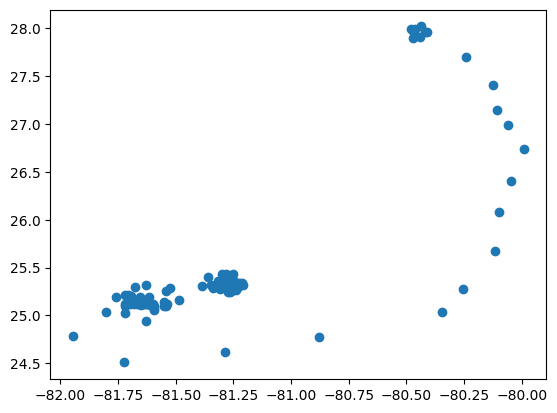

In [13]:
plt.plot(points_y,points_x,linestyle = "",marker = "o")
plt.show()

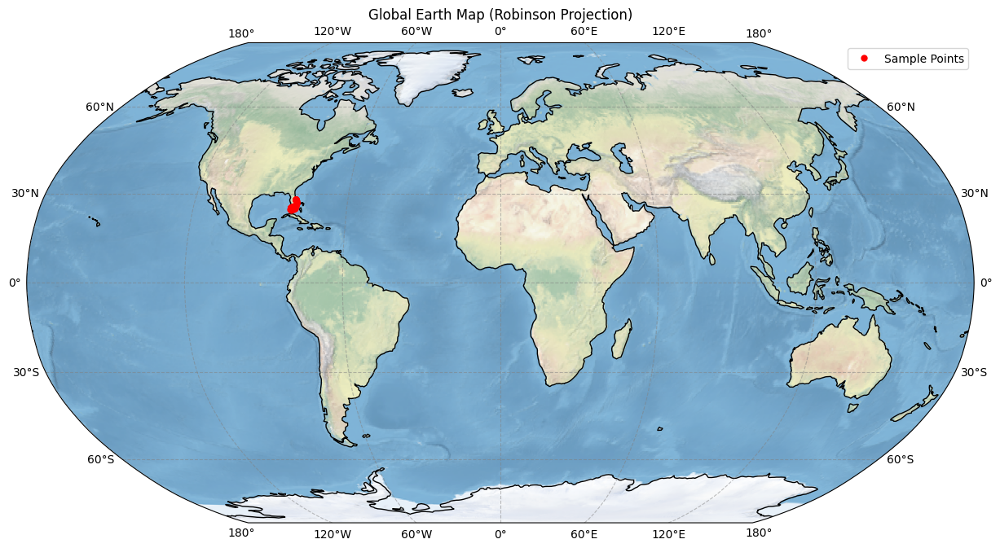

In [10]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs



# Create a figure with a specified projection (Robinson for an Earth map)
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# Add Earth features
ax.stock_img()  # Adds a basic map image with natural Earth shading
ax.coastlines()  # Adds coastlines for continents and countries

# Optional: Add gridlines for latitude and longitude
ax.gridlines(draw_labels=True, color='gray', linestyle='--', alpha=0.5)

# Plot the points on the map
ax.plot(points_y, points_x, 'ro', transform=ccrs.PlateCarree(), markersize=5, label="Sample Points")

# Customize the plot
ax.set_title("Global Earth Map (Robinson Projection)")
plt.legend()
plt.show()


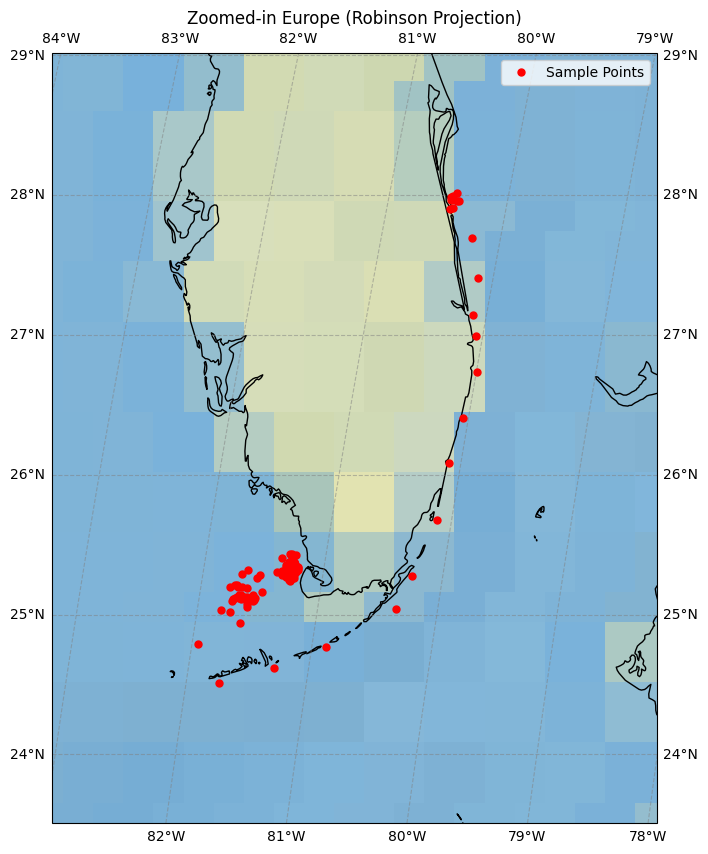

In [16]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs

# Sample coordinates for demonstration (replace with your actual coordinates)

# Create a figure with a specified projection (Robinson for an Earth map)
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# Add Earth features
ax.stock_img()  # Adds a basic map image with natural Earth shading
ax.coastlines()  # Adds coastlines for continents and countries

# Set the extent to focus on a specific region (e.g., Europe)

ax.set_extent([min(points_y)-1, max(points_y)+1, min(points_x)-1,max(points_x)+1], crs=ccrs.PlateCarree())  # [min_lon, max_lon, min_lat, max_lat]

# Optional: Add gridlines for latitude and longitude
ax.gridlines(draw_labels=True, color='gray', linestyle='--', alpha=0.5)

# Plot the points on the map
ax.plot(points_y, points_x, 'ro', transform=ccrs.PlateCarree(), markersize=5, label="Sample Points")

# Customize the plot
ax.set_title("Zoomed-in Europe (Robinson Projection)")
plt.legend()
plt.show()


In [17]:
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature

C:\Users\domin\Desktop\Projects\Turtle-Tracking\venv\Lib\site-packages\cartopy\io\__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)
C:\Users\domin\Desktop\Projects\Turtle-Tracking\venv\Lib\site-packages\cartopy\io\__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/10m_physical/ne_10m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


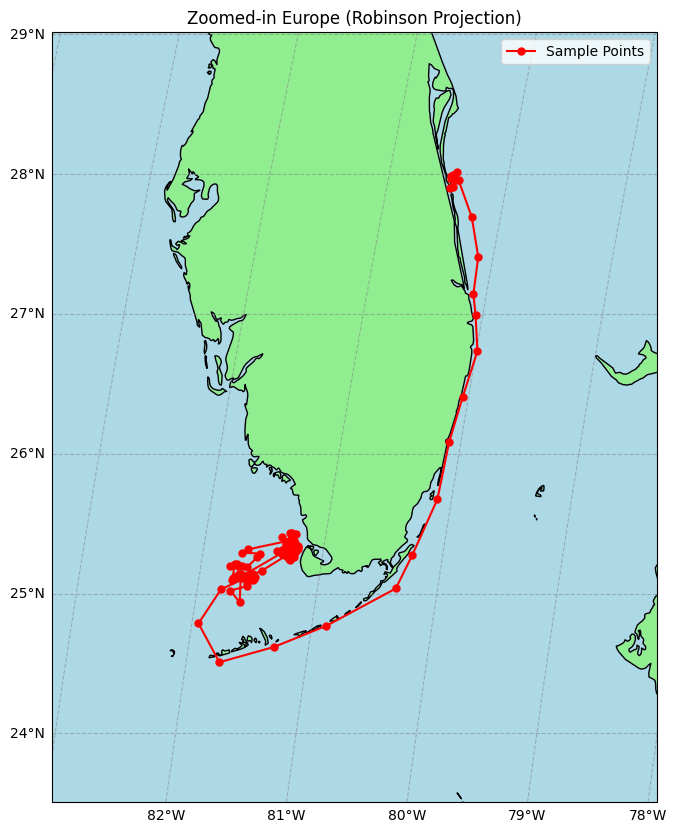

In [18]:
fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.Robinson())

# Add Earth features with finer details for land and water
ax.add_feature(cfeature.LAND, color='lightgreen')  # Set land to a subtle green
ax.add_feature(cfeature.OCEAN, color='lightblue')  # Set ocean to a subtle blue
ax.coastlines()  # Adds coastlines for continents and countries

# Set the extent to focus on a specific region (e.g., Europe)
ax.set_extent([min(points_y) - 1, max(points_y) + 1, min(points_x) - 1, max(points_x) + 1], crs=ccrs.PlateCarree())

# Optional: Add gridlines for latitude and longitude
gridlines = ax.gridlines(draw_labels=True, color='gray', linestyle='--', alpha=0.5)
gridlines.top_labels = False
gridlines.right_labels = False

# Plot the points on the map and connect them with lines
ax.plot(points_y, points_x, 'ro-', transform=ccrs.PlateCarree(), markersize=5, label="Sample Points")

# Customize the plot
ax.set_title("Zoomed-in Europe (Robinson Projection)")
plt.legend()

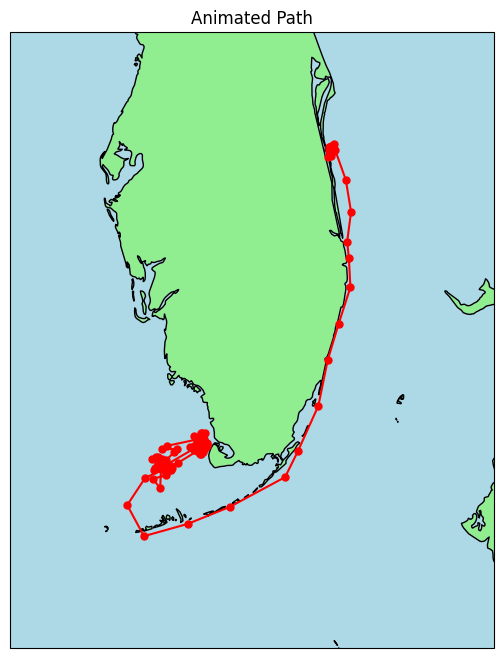

In [31]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from IPython.display import HTML

# Sample coordinates for demonstration (replace these with your actual coordinates)

# Create a figure for the animated path with the Robinson projection
fig2, ax2 = plt.subplots(figsize=(8, 8), subplot_kw={'projection': ccrs.Robinson()})
ax2.set_title("Animated Path")
ax2.set_extent([min(points_y) - 1, max(points_y) + 1, min(points_x) - 1, max(points_x) + 1], crs=ccrs.PlateCarree())

# Add map features (land, ocean, coastlines)
ax2.add_feature(cfeature.LAND, color='lightgreen')
ax2.add_feature(cfeature.OCEAN, color='lightblue')
ax2.coastlines()

# Initialize the plot line object for the animation
path_line, = ax2.plot([], [], 'ro-', markersize=5, transform=ccrs.PlateCarree())

# Initialization function for the animation
def init():
    path_line.set_data([], [])
    return path_line,

# Update function for the animation
def animate(i):
    # Update the line to extend to the ith point
    path_line.set_data(points_y[:i+1], points_x[:i+1])
    return path_line,

# Create the animation
ani = FuncAnimation(fig2, animate, frames=len(points_x), init_func=init, blit=True, interval=500, repeat=False)

# Display the animation in the Jupyter notebook
HTML(ani.to_jshtml())  # This converts the animation to HTML and embeds it in the notebook
